<a href="https://colab.research.google.com/github/saadashraf/DiffusedDG/blob/main/grounding_dino.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/IDEA-Research/Grounded-Segment-Anything

!pip install -q -r Grounded-Segment-Anything/requirements.txt
!pip install -q Grounded-Segment-Anything/GroundingDINO
!pip install -q Grounded-Segment-Anything/segment_anything

Cloning into 'Grounded-Segment-Anything'...
remote: Enumerating objects: 1705, done.
remote: Counting objects: 100% (390/390), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 1705 (delta 329), reused 325 (delta 318), pack-reused 1315
Receiving objects: 100% (1705/1705), 124.77 MiB | 15.62 MiB/s, done.
Resolving deltas: 100% (803/803), done.
Updating files: 100% (234/234), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 107.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 79.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.3/266.3 kB 24.8 MB/s eta 0:00:00
  Installing build dependencies 

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.9/715.9 kB 8.6 MB/s eta 0:00:00


In [3]:
%cd Grounded-Segment-Anything

/content/Grounded-Segment-Anything


In [16]:
import os, sys

# sys.path.append(os.path.join(os.getcwd(), "GroundingDINO"))

import argparse
import copy

from IPython.display import display
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import box_convert

# Grounding DINO
# import GroundingDINO.groundingdino.datasets.transforms as T
# from GroundingDINO.groundingdino.models import build_model
# from GroundingDINO.groundingdino.util import box_ops
# from GroundingDINO.groundingdino.util.slconfig import SLConfig
# from GroundingDINO.groundingdino.util.utils import clean_state_dict, get_phrases_from_posmap
# from GroundingDINO.groundingdino.util.inference import annotate, load_image, predict

import supervision as sv

# segment anything
from segment_anything import build_sam, SamPredictor
import cv2
import numpy as np
import matplotlib.pyplot as plt

#YOLO
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator


# diffusers
import PIL
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionInpaintPipeline


from huggingface_hub import hf_hub_download

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

sam_checkpoint = 'sam_vit_h_4b8939.pth'

sam_predictor = SamPredictor(build_sam(checkpoint=sam_checkpoint).to(device))


--2024-02-21 23:09:00--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.157.254.124, 108.157.254.102, 108.157.254.15, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|108.157.254.124|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   267MB/s    in 10s     

2024-02-21 23:09:11 (236 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [7]:
sd_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting",
    torch_dtype=torch.float16,
).to(device)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [44]:
# Load image
def download_image(url, image_file_path):
    r = requests.get(url, timeout=4.0)
    if r.status_code != requests.codes.ok:
        assert False, 'Status code error: {}.'.format(r.status_code)

    with Image.open(BytesIO(r.content)) as im:
        im.save(image_file_path)
    print('Image downloaded from url: {} and saved to: {}.'.format(url, image_file_path))


local_image_path = "assets/untitled-4.jpg"
# image_url = "https://images.rawpixel.com/image_800/cHJpdmF0ZS9sci9pbWFnZXMvd2Vic2l0ZS8yMDIyLTA1L3Vwd2s2MTc3Nzk0MS13aWtpbWVkaWEtaW1hZ2Uta293YnN1MHYuanBn.jpg"
image_url = "https://hips.hearstapps.com/ghk.h-cdn.co/assets/17/30/pembroke-welsh-corgi.jpg"

download_image(image_url, local_image_path)
# image_source, image = load_image(local_image_path)
# Image.fromarray(image_source)

Image downloaded from url: https://hips.hearstapps.com/ghk.h-cdn.co/assets/17/30/pembroke-welsh-corgi.jpg and saved to: assets/untitled-4.jpg.


In [45]:
# detect object using grounding DINO
def detect(image_path, text_prompt, model, box_threshold = 0.3, text_threshold = 0.25):
  # boxes, logits, phrases = predict(
  #     model=model,
  #     image=image,
  #     caption=text_prompt,
  #     box_threshold=box_threshold,
  #     text_threshold=text_threshold,
  #     device="cuda:0"
  # )

  # annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
  # annotated_frame = annotated_frame[...,::-1] # BGR to RGB
  # return annotated_frame, boxes

  # Load the YOLOv8 model
  model = YOLO('yolov8s.pt')

  # Perform inference on an image
  image_file = cv2.imread(image_path)
  results = model(image_path)

  # Extract bounding boxes, classes, names, and confidences
  boxes = results[0].boxes.xyxy.tolist()
  classes = results[0].boxes.cls.tolist()
  names = results[0].names
  confidences = results[0].boxes.conf.tolist()



  # Iterate through the results
  for box, cls, conf in zip(boxes, classes, confidences):
      annotator = Annotator(image_file)
      name = names[int(cls)]
      annotator.box_label(box, name)

  return image_file, names, boxes

output_img, names, detected_boxes = detect(local_image_path, text_prompt="bench", model="amar naam mofij")

100%|██████████| 21.5M/21.5M [00:00<00:00, 327MB/s]



image 1/1 /content/Grounded-Segment-Anything/assets/untitled-4.jpg: 640x448 1 dog, 101.2ms
Speed: 3.4ms preprocess, 101.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 448)


In [46]:
from google.colab.patches import cv2_imshow

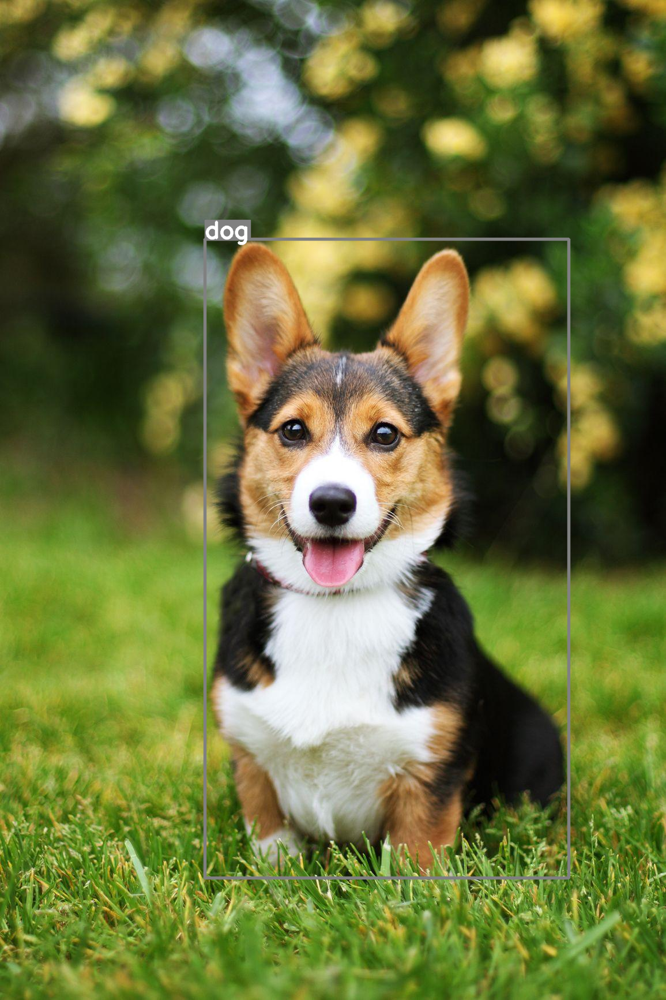

In [47]:
cv2_imshow(output_img)

In [48]:
from PIL import Image

In [50]:
image_source = Image.open(local_image_path)
image_source = np.asarray(image_source)

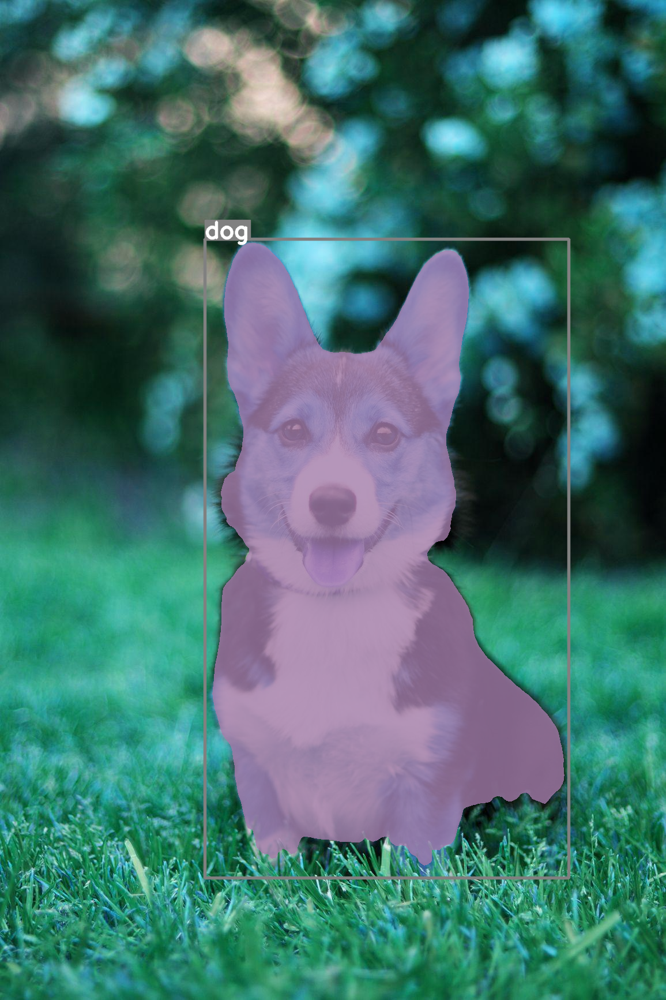

In [54]:
def segment(image, sam_model, boxes):
  sam_model.set_image(image)
  H, W, _ = image.shape
  boxes_xyxy = torch.as_tensor(boxes)

  transformed_boxes = sam_model.transform.apply_boxes_torch(boxes_xyxy.to(device), image.shape[:2])
  masks, _, _ = sam_model.predict_torch(
      point_coords = None,
      point_labels = None,
      boxes = transformed_boxes,
      multimask_output = False,
      )
  return masks.cpu()

def draw_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))
segmented_frame_masks = segment(image_source, sam_predictor, boxes=detected_boxes)
annotated_frame_with_mask = draw_mask(segmented_frame_masks[0][0], output_img)
Image.fromarray(annotated_frame_with_mask)

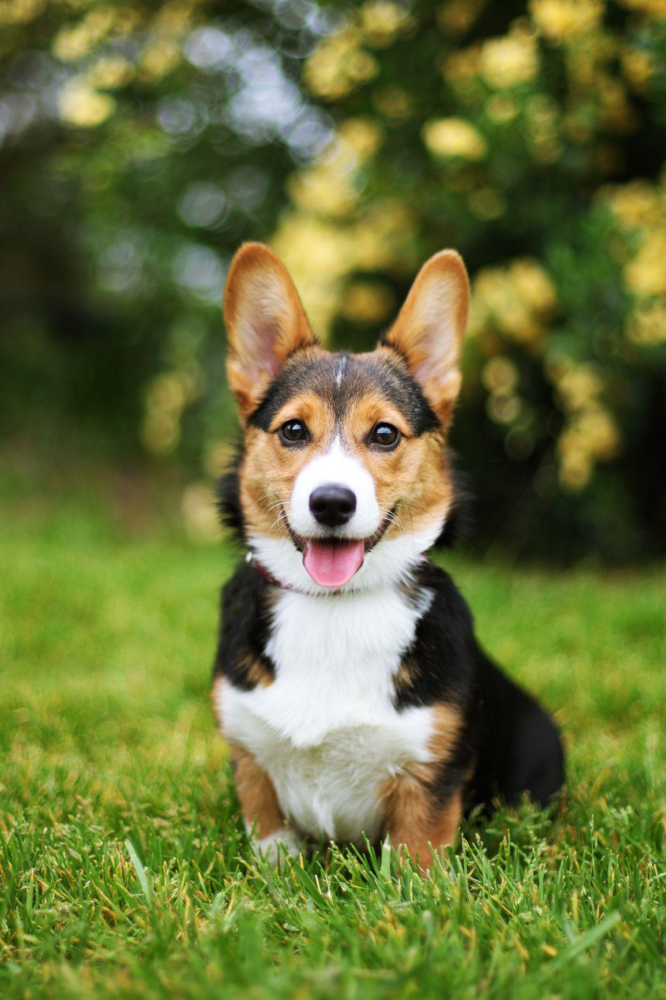

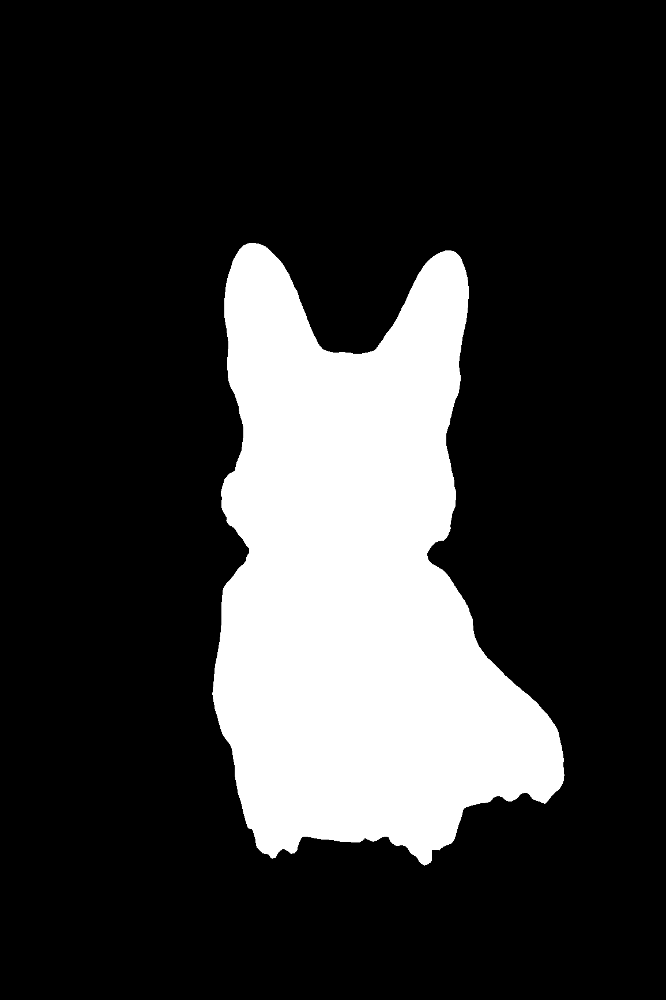

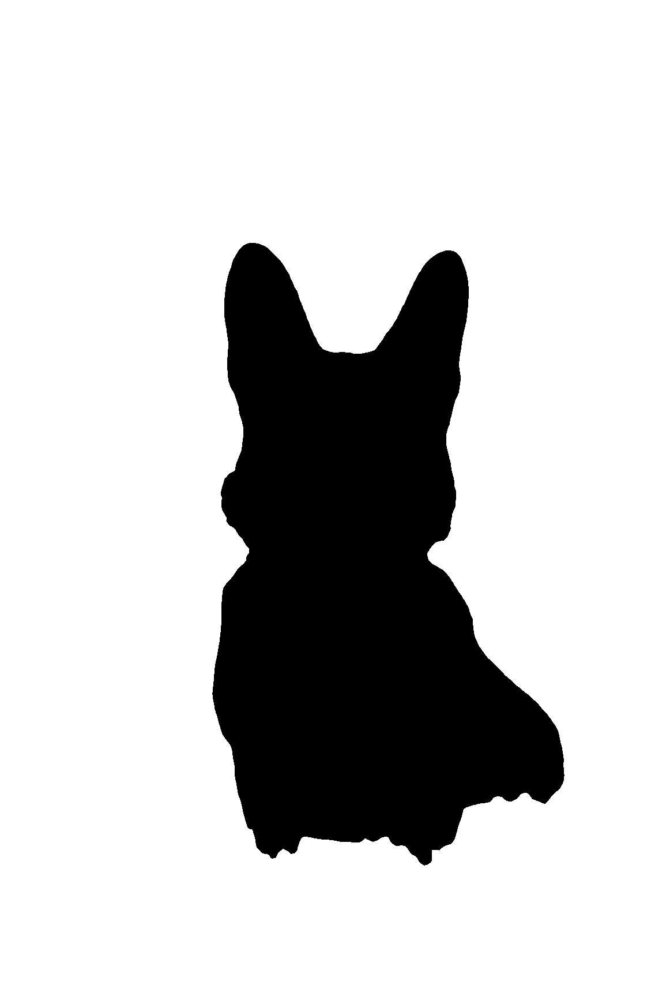

In [55]:
# create mask images
mask = segmented_frame_masks[0][0].cpu().numpy()
inverted_mask = ((1 - mask) * 255).astype(np.uint8)


image_source_pil = Image.fromarray(image_source)
image_mask_pil = Image.fromarray(mask)
inverted_image_mask_pil = Image.fromarray(inverted_mask)


display(*[image_source_pil, image_mask_pil, inverted_image_mask_pil])

In [56]:
def generate_image(image, mask, prompt, negative_prompt, pipe, seed):
  # resize for inpainting
  w, h = image.size
  in_image = image.resize((512, 512))
  in_mask = mask.resize((512, 512))

  generator = torch.Generator(device).manual_seed(seed)

  result = pipe(image=in_image, mask_image=in_mask, prompt=prompt, negative_prompt=negative_prompt, generator=generator)
  result = result.images[0]

  return result.resize((w, h))


  0%|          | 0/50 [00:00<?, ?it/s]

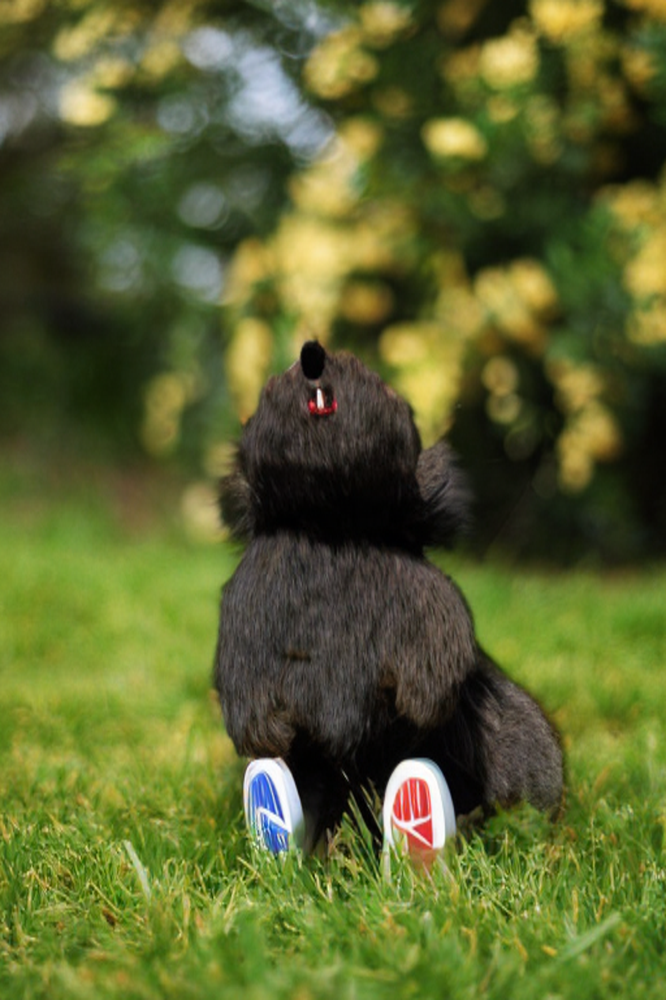

In [62]:
prompt="dancing barack obama"
negative_prompt="low resolution, ugly"
seed = -1 # for reproducibility

generated_image = generate_image(image=image_source_pil, mask=image_mask_pil, prompt=prompt, negative_prompt=negative_prompt, pipe=sd_pipe, seed=seed)
generated_image

  0%|          | 0/50 [00:00<?, ?it/s]

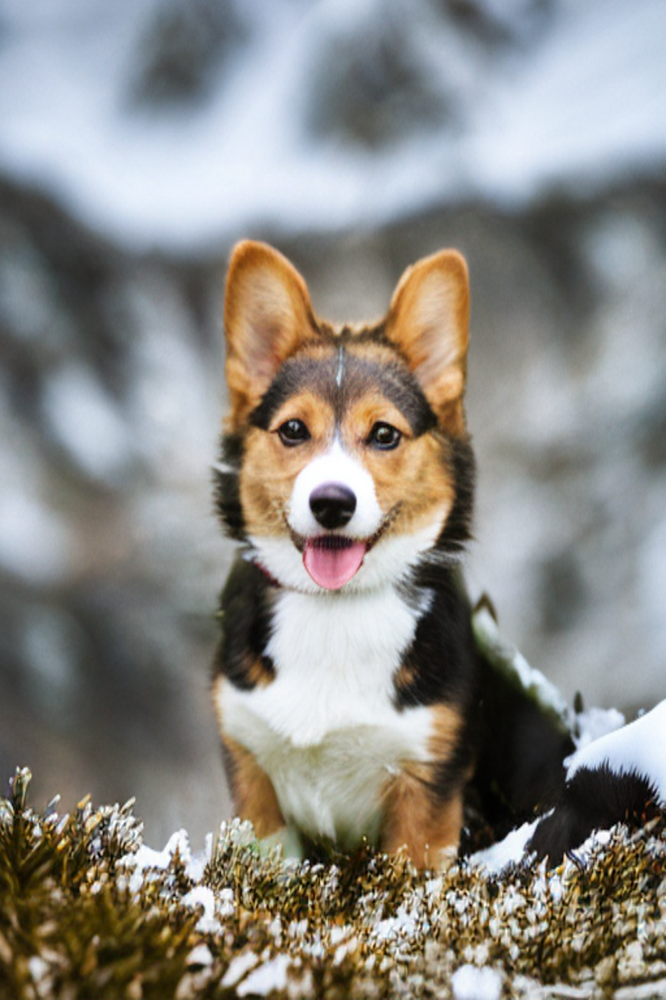

In [60]:
prompt="Snowy mountain, weak sunlight "
negative_prompt="people, low resolution, ugly"
seed = 32 # for reproducibility

generated_image = generate_image(image_source_pil, inverted_image_mask_pil, prompt, negative_prompt, sd_pipe, seed)
generated_image